In [4]:
import json

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
from tqdm import tqdm
import h5py

In [7]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [8]:
f = h5py.File('img_codes.hdf5', 'r')
img_codes = f['data']

In [9]:
captions = json.load(open('captions_tokenized.json'))

In [10]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [11]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [12]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
# <YOUR CODE HERE>
for caption_list in captions:
    word_counts.update(sum(caption_list, []))

In [13]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

In [14]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [15]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]], dtype=int32)

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [16]:
import torch
import torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [17]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        result = torch.bmm(queries, keys.transpose(1, 2)) / (keys.shape[2] ** 0.5)
        return result

Test for ScaledDotProductScore

In [18]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [19]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        # <YOUR CODE HERE>
        weights = F.softmax(scores, dim=-1)
        self.attention_map = weights.detach()
        # <YOUR CODE HERE>
        result = torch.bmm(weights, values)
        return result

Tests for Attention layer

In [20]:
attn = Attention(ScaledDotProductScore())

In [21]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [22]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
# в assert был код torch.isnan(attn.last_weights).sum() == 0, однако у attn нет поля last_weights
# видимо имелось в виду attn.attention_map
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [23]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [24]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(n_tokens, emb_size)
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention = attn = Attention(ScaledDotProductScore())
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(cnn_channels+emb_size, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Linear(cnn_channels + lstm_units + emb_size, n_tokens)
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)
        
        attn_keys = self.cnn_to_attn_key(image_features)
       
        reccurent_out, attention_map = [], []
        hidden_state, cell_state = initial_hid, initial_cell
        for token_pos in range(captions_ix.shape[1]):
            # print([x.shape for x in [hidden_state.unsqueeze(1), attn_keys, image_features]])
            context_vector = self.attention(hidden_state.unsqueeze(1), attn_keys, image_features).squeeze(1)
            # print('context_vector', context_vector.shape)
            # print('context_vector', captions_emb[:, token_pos].shape)
            current_emb = captions_emb[:, token_pos]
            lstm_input = torch.cat([context_vector, current_emb], dim=1)
            hidden_state, cell_state = self.lstm(lstm_input, (hidden_state, cell_state))

            reccurent_out.append(
                torch.cat([context_vector, hidden_state, current_emb], dim=1)
            )
            # print('r_out', torch.cat([context_vector, hidden_state, current_emb], dim=1).shape)
            attention_map.append(self.attention.attention_map)
    
         # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        reccurent_out = torch.stack(reccurent_out, dim=1)
        attention_map = torch.stack(attention_map, dim=1).squeeze(2)
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(reccurent_out) # <YOUR_CODE>
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [25]:
network = CaptionNet(n_tokens)

In [26]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [27]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    loss = F.cross_entropy(logits_for_next.permute([0, 2, 1]), captions_ix_next, ignore_index=pad_ix)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [28]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [29]:
# <YOUR CODE>
optimizer = torch.optim.Adam(network.parameters())

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [30]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [31]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

In [32]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [35]:
batch_size = 64  # adjust me
n_epochs = 64    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch
log_every = 8

In [36]:
from tqdm import tqdm
from torch.utils.tensorboard import SummaryWriter

writer = SummaryWriter()

global_step = 0
for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train()
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for i in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
            network.zero_grad()
            loss_t.backward()
            optimizer.step()
        
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            # <YOUR CODE>
        
            train_loss += loss_t.item()
            
            if (i + 1) % log_every == 0:
                writer.add_scalar('loss', loss_t.item(), global_step=global_step)
            global_step += 1

    train_loss /= n_batches_per_epoch
    writer.add_scalar('train_loss', train_loss, global_step=global_step)
        
    val_loss=0
    network.eval()
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += loss_t.item()
    val_loss /= n_validation_batches
    writer.add_scalar('val_loss', val_loss, global_step=global_step)
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 64/64 [00:20<00:00,  3.07it/s]



Epoch: 0, train loss: 7.022698722779751, val loss: 5.390985667705536


100%|██████████| 64/64 [00:20<00:00,  3.14it/s]



Epoch: 1, train loss: 4.999836124479771, val loss: 4.689525306224823


100%|██████████| 64/64 [00:20<00:00,  3.15it/s]



Epoch: 2, train loss: 4.61504864692688, val loss: 4.472584784030914


100%|██████████| 64/64 [00:20<00:00,  3.19it/s]



Epoch: 3, train loss: 4.38386782258749, val loss: 4.370893716812134


100%|██████████| 64/64 [00:19<00:00,  3.22it/s]



Epoch: 4, train loss: 4.239133156836033, val loss: 4.2270925641059875


100%|██████████| 64/64 [00:19<00:00,  3.26it/s]



Epoch: 5, train loss: 4.144936442375183, val loss: 4.096656054258347


100%|██████████| 64/64 [00:19<00:00,  3.27it/s]



Epoch: 6, train loss: 4.046493694186211, val loss: 4.032243013381958


100%|██████████| 64/64 [00:19<00:00,  3.36it/s]



Epoch: 7, train loss: 4.025376934558153, val loss: 3.9340859949588776


100%|██████████| 64/64 [00:18<00:00,  3.41it/s]



Epoch: 8, train loss: 3.9616149961948395, val loss: 3.911297470331192


100%|██████████| 64/64 [00:18<00:00,  3.41it/s]



Epoch: 9, train loss: 3.8809944689273834, val loss: 3.881452649831772


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 10, train loss: 3.853065997362137, val loss: 3.803565889596939


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 11, train loss: 3.8265819139778614, val loss: 3.8117164373397827


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 12, train loss: 3.7796959914267063, val loss: 3.773018091917038


100%|██████████| 64/64 [00:18<00:00,  3.46it/s]



Epoch: 13, train loss: 3.7477552071213722, val loss: 3.7949776351451874


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 14, train loss: 3.7179276570677757, val loss: 3.698088437318802


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 15, train loss: 3.6734249144792557, val loss: 3.713624745607376


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 16, train loss: 3.7085290253162384, val loss: 3.635171055793762


100%|██████████| 64/64 [00:18<00:00,  3.43it/s]



Epoch: 17, train loss: 3.669418800622225, val loss: 3.5312296748161316


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 18, train loss: 3.6607035882771015, val loss: 3.6737968027591705


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 19, train loss: 3.637013252824545, val loss: 3.581165134906769


100%|██████████| 64/64 [00:18<00:00,  3.43it/s]



Epoch: 20, train loss: 3.5950958617031574, val loss: 3.5740825831890106


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 21, train loss: 3.6055191941559315, val loss: 3.552000552415848


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 22, train loss: 3.5670322738587856, val loss: 3.5872183442115784


100%|██████████| 64/64 [00:18<00:00,  3.43it/s]



Epoch: 23, train loss: 3.5590635053813457, val loss: 3.5769761502742767


100%|██████████| 64/64 [00:18<00:00,  3.47it/s]



Epoch: 24, train loss: 3.5311875008046627, val loss: 3.553259640932083


100%|██████████| 64/64 [00:18<00:00,  3.41it/s]



Epoch: 25, train loss: 3.539404857903719, val loss: 3.550368219614029


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 26, train loss: 3.4825710244476795, val loss: 3.517717659473419


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 27, train loss: 3.480103526264429, val loss: 3.618317663669586


100%|██████████| 64/64 [00:18<00:00,  3.46it/s]



Epoch: 28, train loss: 3.446458637714386, val loss: 3.4256179332733154


100%|██████████| 64/64 [00:18<00:00,  3.47it/s]



Epoch: 29, train loss: 3.420169372111559, val loss: 3.4941098392009735


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 30, train loss: 3.4595756828784943, val loss: 3.441424250602722


100%|██████████| 64/64 [00:18<00:00,  3.44it/s]



Epoch: 31, train loss: 3.438527926802635, val loss: 3.5210819840431213


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 32, train loss: 3.420868221670389, val loss: 3.4013354778289795


100%|██████████| 64/64 [00:18<00:00,  3.43it/s]



Epoch: 33, train loss: 3.40790393948555, val loss: 3.4147844910621643


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 34, train loss: 3.4126178957521915, val loss: 3.425185054540634


100%|██████████| 64/64 [00:18<00:00,  3.47it/s]



Epoch: 35, train loss: 3.4259149692952633, val loss: 3.443534642457962


100%|██████████| 64/64 [00:18<00:00,  3.46it/s]



Epoch: 36, train loss: 3.411155890673399, val loss: 3.3969300985336304


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 37, train loss: 3.415480822324753, val loss: 3.4158351719379425


100%|██████████| 64/64 [00:18<00:00,  3.44it/s]



Epoch: 38, train loss: 3.384239189326763, val loss: 3.493633210659027


100%|██████████| 64/64 [00:18<00:00,  3.43it/s]



Epoch: 39, train loss: 3.3835932910442352, val loss: 3.353298634290695


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 40, train loss: 3.3913632594048977, val loss: 3.314584642648697


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 41, train loss: 3.3668118976056576, val loss: 3.464671105146408


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 42, train loss: 3.3731423392891884, val loss: 3.4058526158332825


100%|██████████| 64/64 [00:18<00:00,  3.44it/s]



Epoch: 43, train loss: 3.3647506833076477, val loss: 3.3177169263362885


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 44, train loss: 3.368127219378948, val loss: 3.350356310606003


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 45, train loss: 3.346505593508482, val loss: 3.3395798802375793


100%|██████████| 64/64 [00:18<00:00,  3.45it/s]



Epoch: 46, train loss: 3.343319822102785, val loss: 3.415291905403137


100%|██████████| 64/64 [00:18<00:00,  3.46it/s]



Epoch: 47, train loss: 3.3549989387392998, val loss: 3.3320783376693726


100%|██████████| 64/64 [00:18<00:00,  3.39it/s]



Epoch: 48, train loss: 3.3379967138171196, val loss: 3.3452086448669434


100%|██████████| 64/64 [00:19<00:00,  3.31it/s]



Epoch: 49, train loss: 3.3386839106678963, val loss: 3.3836247622966766


100%|██████████| 64/64 [00:19<00:00,  3.26it/s]



Epoch: 50, train loss: 3.3079130202531815, val loss: 3.4191410839557648


100%|██████████| 64/64 [00:20<00:00,  3.13it/s]



Epoch: 51, train loss: 3.3317187428474426, val loss: 3.3289290964603424


100%|██████████| 64/64 [00:20<00:00,  3.12it/s]



Epoch: 52, train loss: 3.2584750913083553, val loss: 3.3501798808574677


100%|██████████| 64/64 [00:20<00:00,  3.13it/s]



Epoch: 53, train loss: 3.2750780023634434, val loss: 3.3887028098106384


100%|██████████| 64/64 [00:20<00:00,  3.11it/s]



Epoch: 54, train loss: 3.2798799835145473, val loss: 3.3831488490104675


100%|██████████| 64/64 [00:20<00:00,  3.11it/s]



Epoch: 55, train loss: 3.3019004464149475, val loss: 3.382797986268997


100%|██████████| 64/64 [00:20<00:00,  3.12it/s]



Epoch: 56, train loss: 3.261302575469017, val loss: 3.3046533465385437


100%|██████████| 64/64 [00:20<00:00,  3.13it/s]



Epoch: 57, train loss: 3.2633719965815544, val loss: 3.4258625507354736


100%|██████████| 64/64 [00:20<00:00,  3.12it/s]



Epoch: 58, train loss: 3.2803490050137043, val loss: 3.302170604467392


100%|██████████| 64/64 [00:20<00:00,  3.13it/s]



Epoch: 59, train loss: 3.2644646242260933, val loss: 3.3654949963092804


100%|██████████| 64/64 [00:20<00:00,  3.13it/s]



Epoch: 60, train loss: 3.285881843417883, val loss: 3.3967654407024384


100%|██████████| 64/64 [00:20<00:00,  3.09it/s]



Epoch: 61, train loss: 3.2728711552917957, val loss: 3.3850166499614716


100%|██████████| 64/64 [00:20<00:00,  3.16it/s]



Epoch: 62, train loss: 3.255776636302471, val loss: 3.2634306252002716


100%|██████████| 64/64 [00:20<00:00,  3.13it/s]



Epoch: 63, train loss: 3.257535584270954, val loss: 3.277421712875366
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [37]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [38]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [39]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

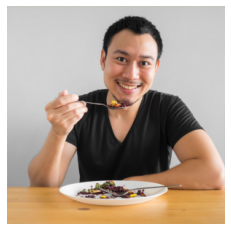

In [40]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man in a blue shirt and a white shirt and tie
a man in a white shirt and a tie in a room .
a man in a blue shirt and a blue shirt and a tie .
a man in a blue shirt and a tie in a mirror .
a man in a blue shirt and a tie sitting on a table .
a man in a blue shirt and tie sitting on a table .
a man in a blue shirt and a tie
a man in a blue shirt and a blue shirt and tie .
a man in a blue shirt and a white shirt and a tie .
a man in a blue shirt and a white shirt and a tie .


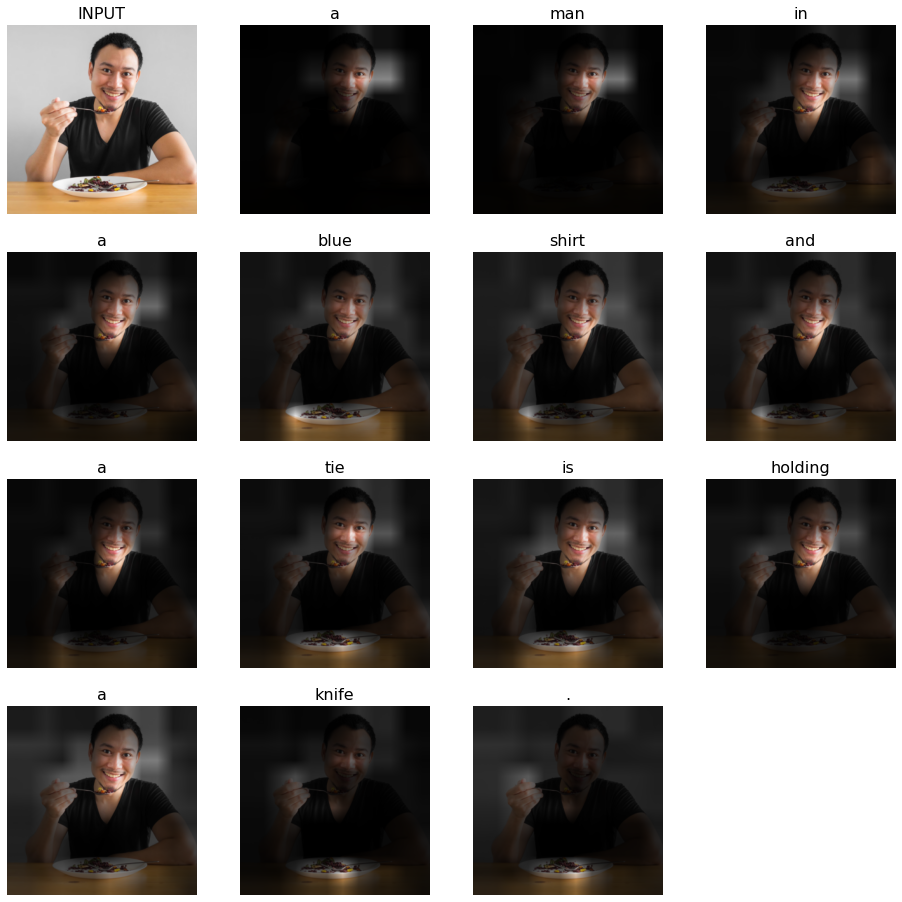

In [41]:
process_image(img)

a man riding a bike on a road with a mountain .
a man riding a bike down a road with a mountain on the side of the road .
a man riding a bike on a lush green field .
a man riding a bike on a lush green hillside .
a man riding a bike on a lush green hillside .
a man riding a bike on a road with mountains in the background .
a man riding a bike on a lush green field .
a man riding a bike down a road with a mountain in the background .
a man riding a bike on a lush green field .
a man riding a bike on a dirt road .


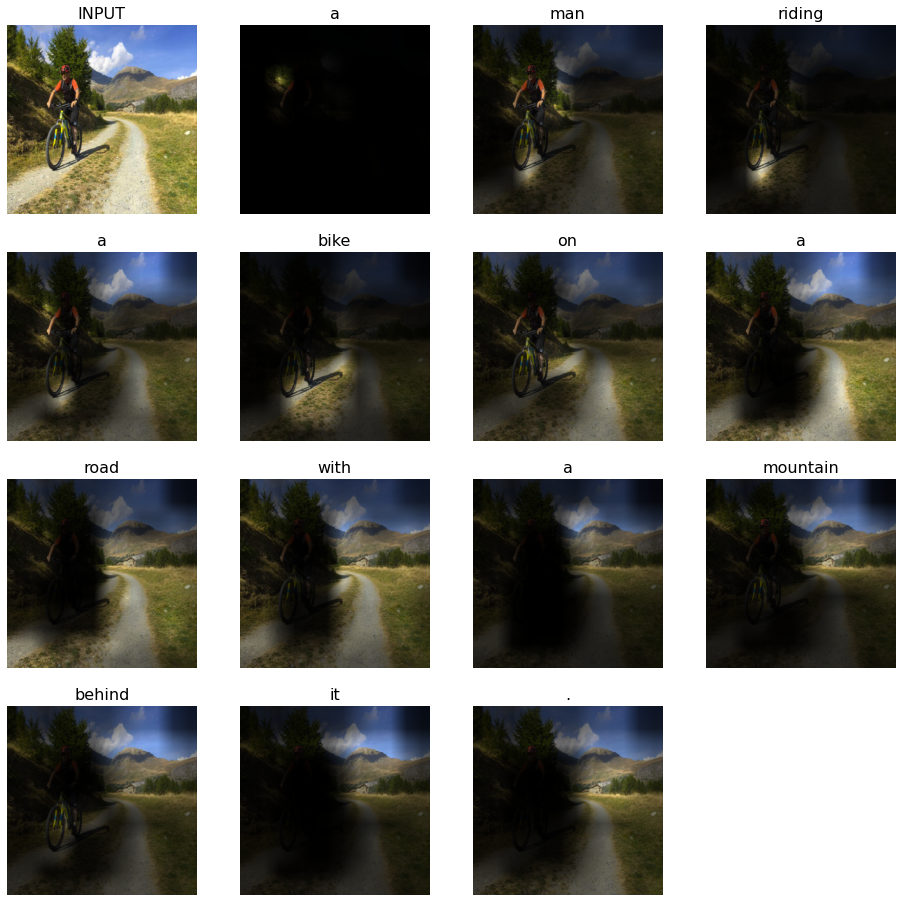

In [42]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a cat sitting on a bench with a dog in the background .
a cat sitting on a couch with a cat on its head .
a cat laying on a blanket on a couch .
a cat laying on a chair next to a car .
a cat sitting on a couch with a dog on its head .
a cat laying on a chair with a cat on the back .
a cat laying on a blanket on a couch .
a cat laying on a couch with a cat on the back of a cat .
a cat laying on a couch with a cat on its head .
a cat sitting on a couch with a dog on its head .


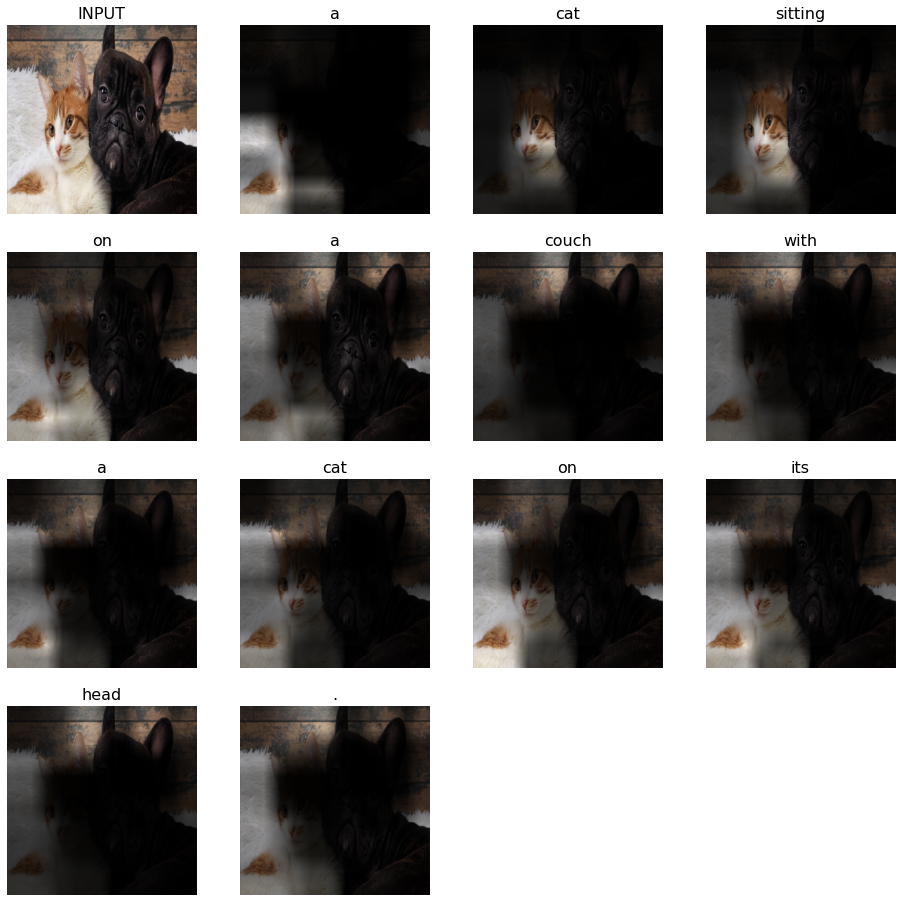

In [43]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man riding a skateboard on a skate board .
a man riding a skateboard on a skate board .
a man riding a skateboard on a skate board .
a man riding a skateboard on a skate board
a man riding a skateboard on a skate board
a man riding a skateboard on a ramp in the air .
a man in a helmet riding a skateboard on a skateboard .
a man doing tricks on a skateboard doing a trick .
a man riding a skateboard on a skate board
a man riding a skateboard on a skate board .


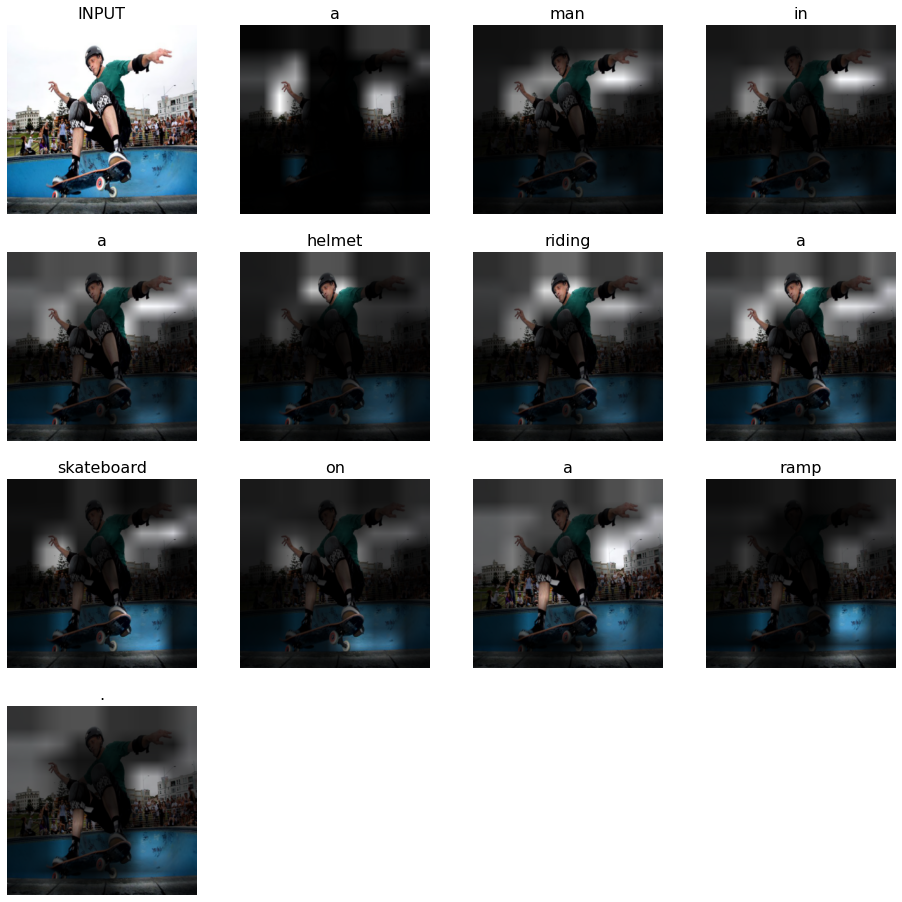

In [44]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

Изображения идут от простых к сложным

Простые: на переднем плане есть человек, который делает простое действие, задний фон узнаваемый

Сложные: на изображении нет действующего лица, либо их одновременно несколько

a man in a suit and tie standing next to a building .
a man in a suit and tie standing next to a woman .
a man in a black jacket and tie standing on a sidewalk .
a man in a suit and tie standing on a sidewalk .
a man in a suit and tie standing next to a building .
a man in a suit and tie standing next to a building .
a man in a black jacket and tie standing in a parking lot .
a man in a suit and tie standing next to a sidewalk .
a man in a suit and tie standing in a field .
a man in a hat and tie standing on a sidewalk .


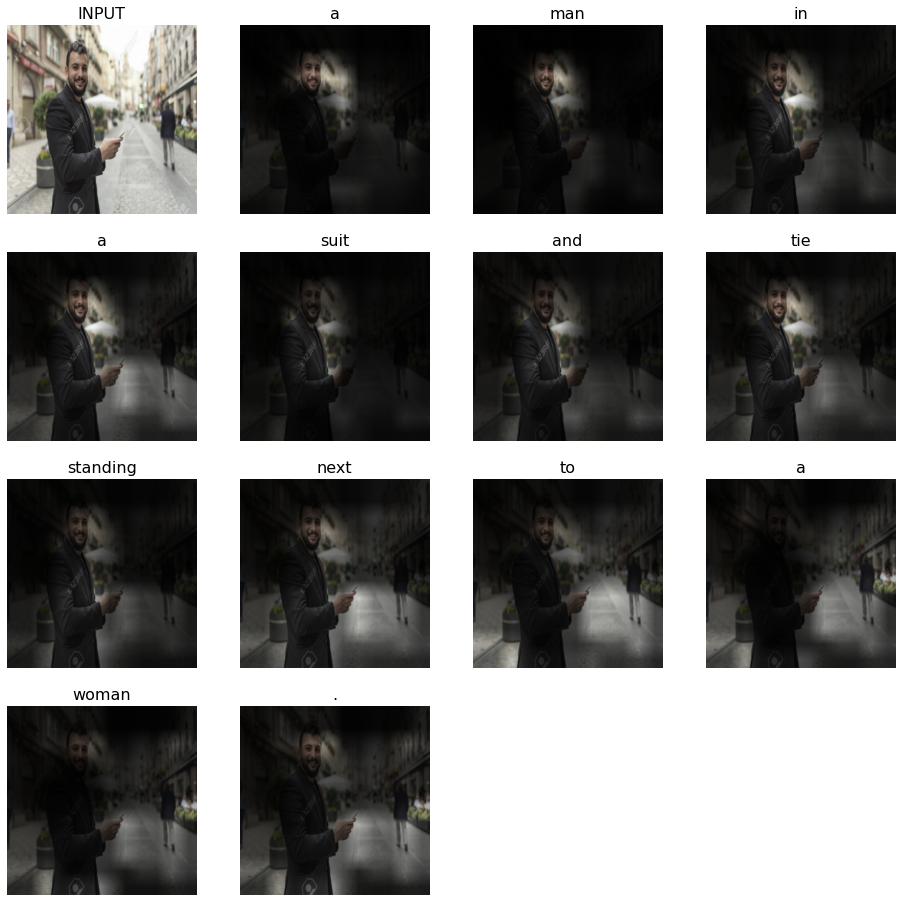

In [49]:
#apply your network on image sample you found
#
#

process_image(obtain_image(url="https://previews.123rf.com/images/maxriesgo/maxriesgo1805/maxriesgo180500179/102548520-man-in-the-city-with-smartphone-looking-at-camera.jpg"))

a person on skis on a snowy slope .
a person on skis in the snow with a snowboard .
a person on skis on a snowy slope .
a person on a snowboard on a snowy slope .
a person on a snowboard on a snowy slope .
a person on a snowboard on a snowy slope .
a person on skis in the snow with a snowboard .
a person on skis on a snowy slope .
a man skiing down a snow covered slope .
a man on a snowboard on a snowy slope .


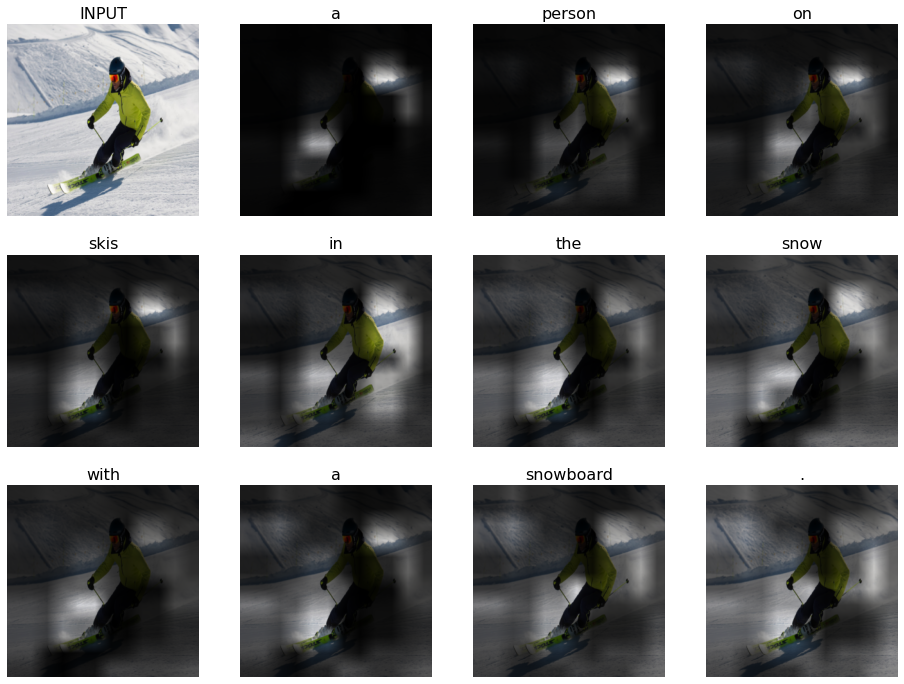

In [55]:
process_image(obtain_image(url="https://sport-marafon.ru/upload/iblock/ef3/1377-001.jpg"))

a group of people playing soccer on a field .
a group of people playing soccer on a field .
a group of people playing soccer on a field .
a group of men playing soccer on a field
a group of men playing soccer on a field .
a group of people playing soccer on a field .
a group of young men playing soccer on a field .
a group of people playing soccer on a field .
a group of people playing soccer on a field .
a group of people playing soccer on a field .


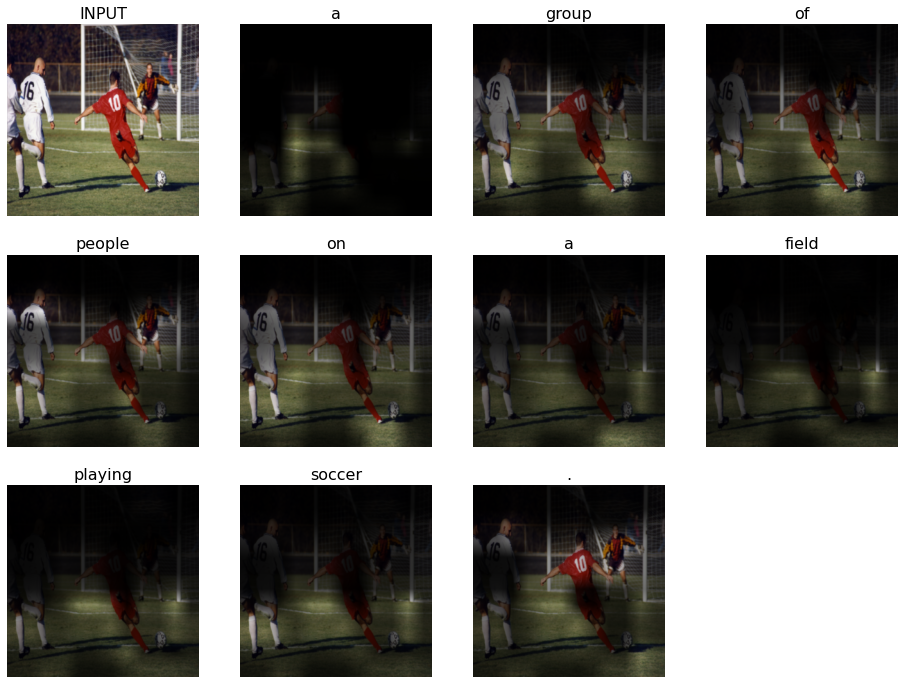

In [56]:
process_image(obtain_image(url="https://upload.wikimedia.org/wikipedia/commons/b/b9/Football_iu_1996.jpg"))

a woman holding a pink flower in a vase .
a woman holds a pink flowers in a room .
a woman holding a purple flower in a white shirt .
a woman holding a pink flowers in a chair .
a woman holding a pink vase with flowers in it .
a young girl holding a pink flowers in a room .
a woman in a blue shirt and a pink shirt and a pink shirt .
a woman in a pink shirt and a pink tie .
a woman in a pink shirt and a pink shirt and a pink shirt .
a woman and a child in a chair with a pink flowers in the background .


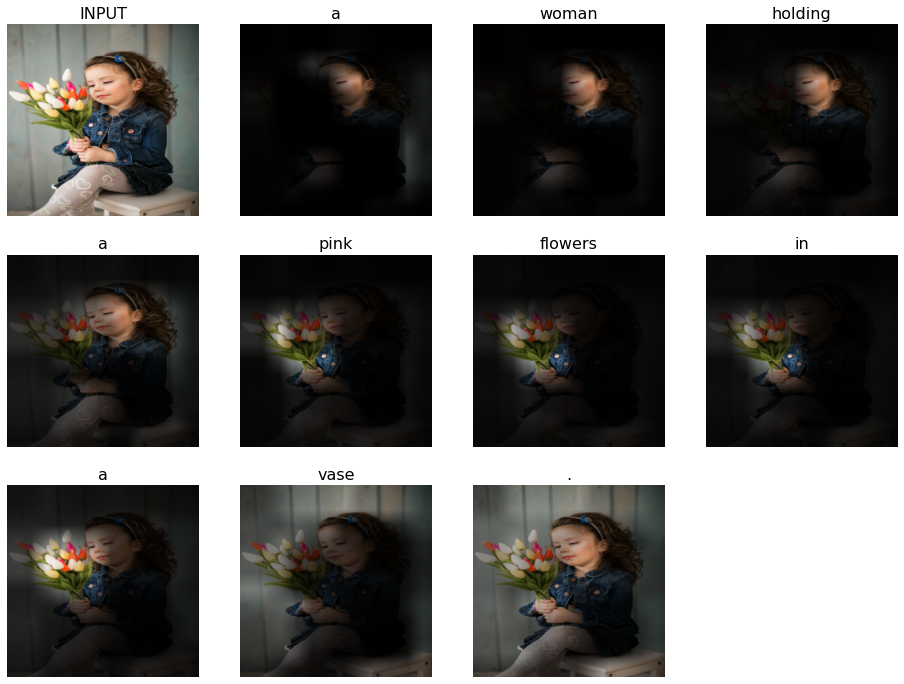

In [62]:
process_image(obtain_image(url="https://image.freepik.com/free-photo/little-girl-with-flowers-in-studio_1303-5624.jpg"))

a group of people watching a large crowd watching a man .
a group of people sitting around a crowded street .
a group of people standing around a crowded street .
a group of people standing around a crowded street .
a group of people standing around a crowded street .
a group of people standing around a crowd watching a crowd watching .
a group of people standing around a crowded street .
a group of people are watching a man in a crowd .
a group of people standing around a crowded street .
a group of people standing around a crowded street .


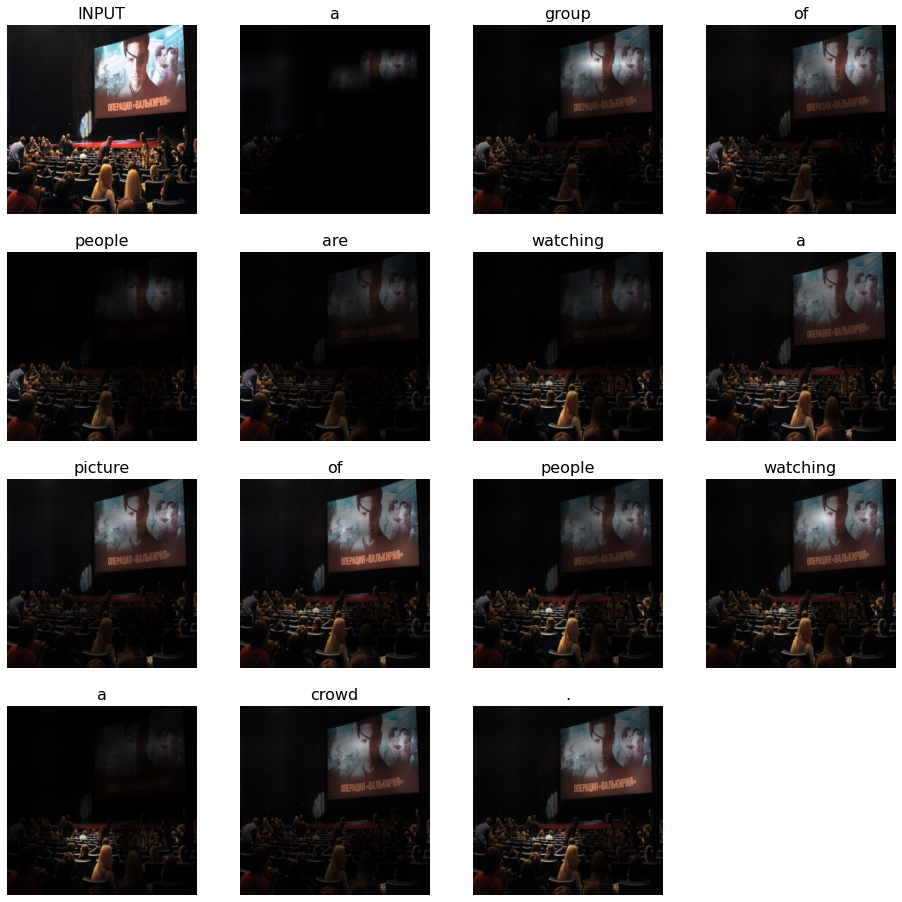

In [58]:
process_image(obtain_image(url="https://tamlife.ru/uploads/2018/04/kino_vs-1000x667.jpg"))

a large city with a clock tower in the background .
a city street with a large clock tower .
a large city with a city skyline in the background .
a large city with a clock tower in the background
a large city with many buildings in the background .
a city street with many buildings and buildings .
a city with a large clock tower in the background .
a city street with a clock tower in the background .
a large city with a large clock tower .
a large city with a clock tower in the background


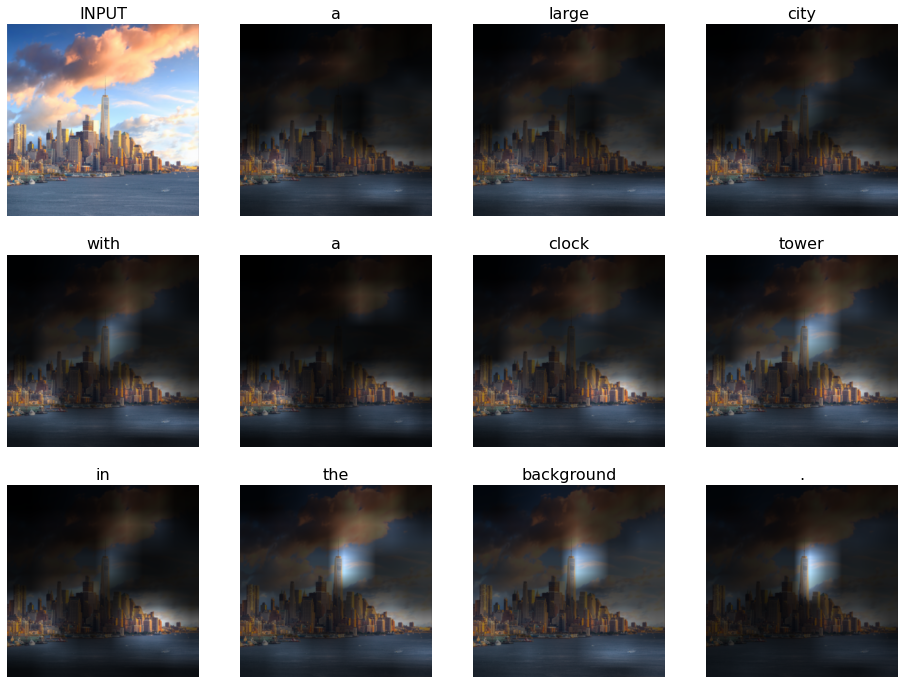

In [47]:

# image without an active person in the foreground (New York)
process_image(obtain_image(url="https://i.insider.com/5d0150e06fc9200b5a05f042"))

a man standing next to a woman in a parking lot .
a man standing in a field with a frisbee in the background .
a man in a suit and a red jacket standing on a sidewalk .
a man standing next to a woman in a parking lot .
a man in a suit and a tie standing in a field
a man and woman standing in a parking lot with a cell phone .
a man standing in a parking lot with a surfboard .
a man in a suit and a backpack standing in a field .
a man in a suit and tie standing in a field .
a man and woman standing in a field with a surfboard in the background .


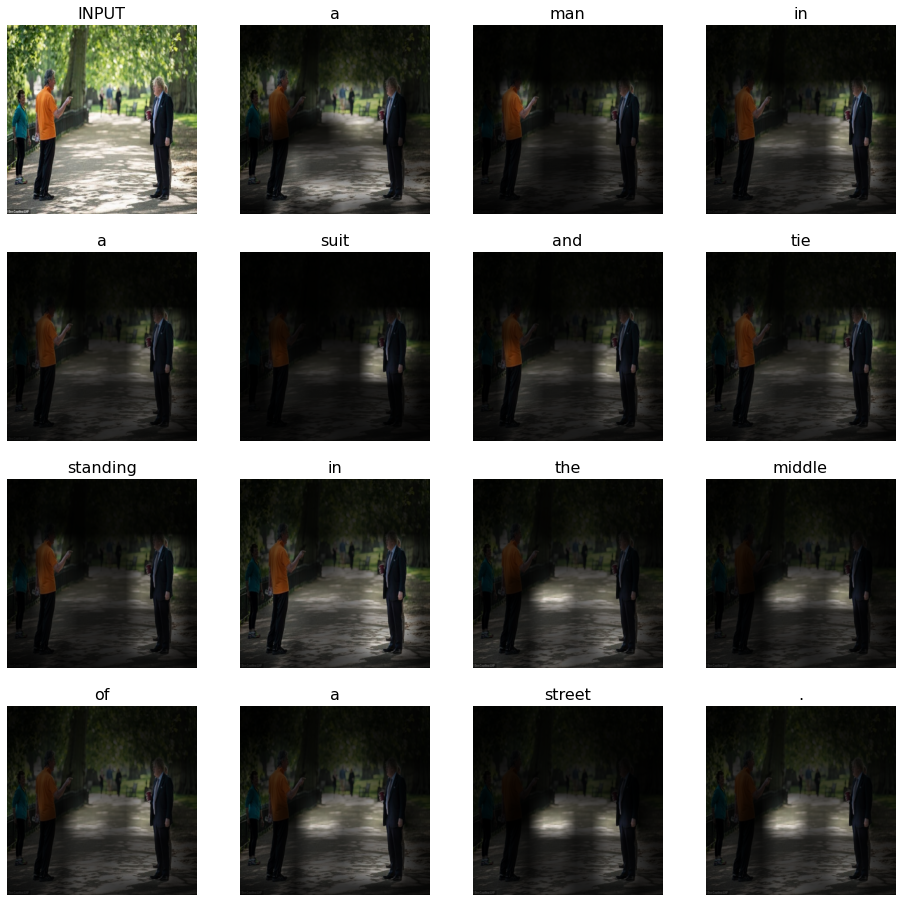

In [48]:
process_image(obtain_image(url="https://images.news18.com/ibnlive/uploads/2020/05/1589176780_untitled-design-2020-05-11t112926.115.jpg"))

a group of people standing in a room holding a cell phone .
a man and woman standing next to a woman in a suit .
a group of people standing in a room holding a wii controller .
a man in a suit and tie standing next to a woman in a suit .
a group of people standing next to each other .
a group of people standing in a living room with a large umbrella .
a group of people standing in a room with a cell phone .
a group of people standing in a room holding a cell phone
a man and woman posing for a picture with a cell phone .
a group of people standing in a room with a man in the background .


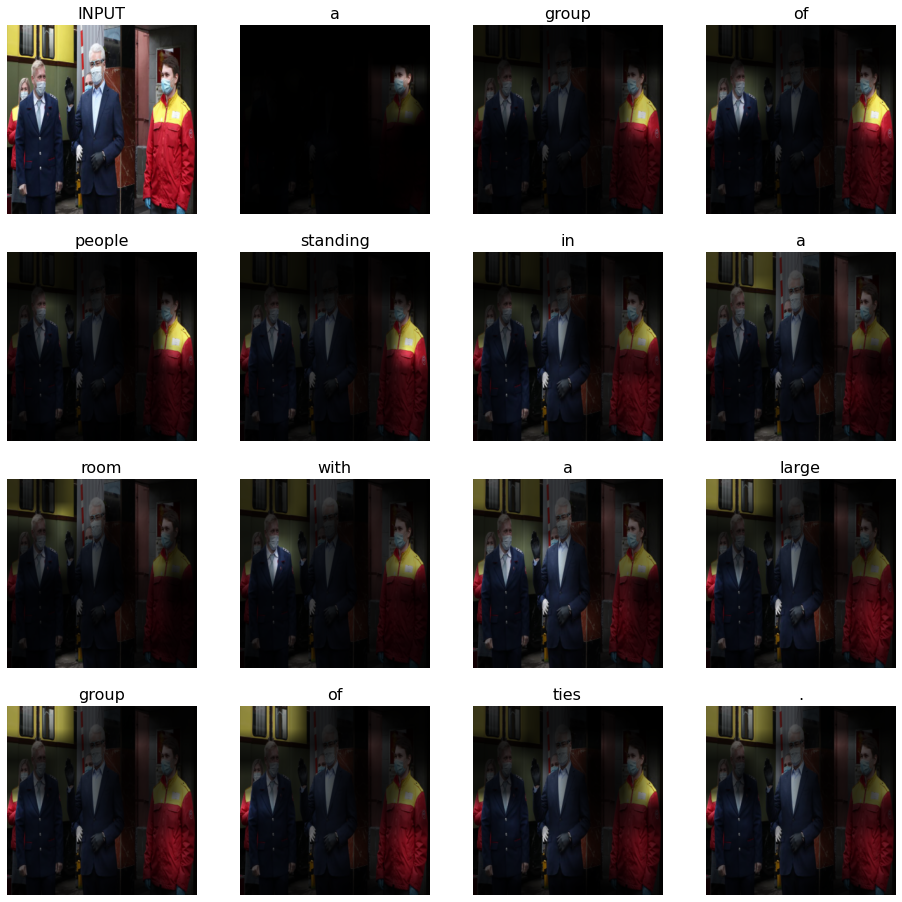

In [50]:
process_image(obtain_image(url="https://cdn.iz.ru/sites/default/files/styles/900x506/public/news-2020-05/TASS_39800309.jpg"))


a person on a bike with a dog on the back of a bicycle .
a man sitting on a bench with a bicycle in the background .
a person sitting on a bench with a bicycle .
a person riding a bike on a sidewalk near a building .
a person sitting on a bench with a bicycle .
a person sitting on a bench with a dog on the street .
a person on a bicycle with a dog on the back of a bicycle .
a person sitting on a bench with a bike .
a person sitting on a bench with a dog on the side of a street .
a person is sitting on a bench with a dog .


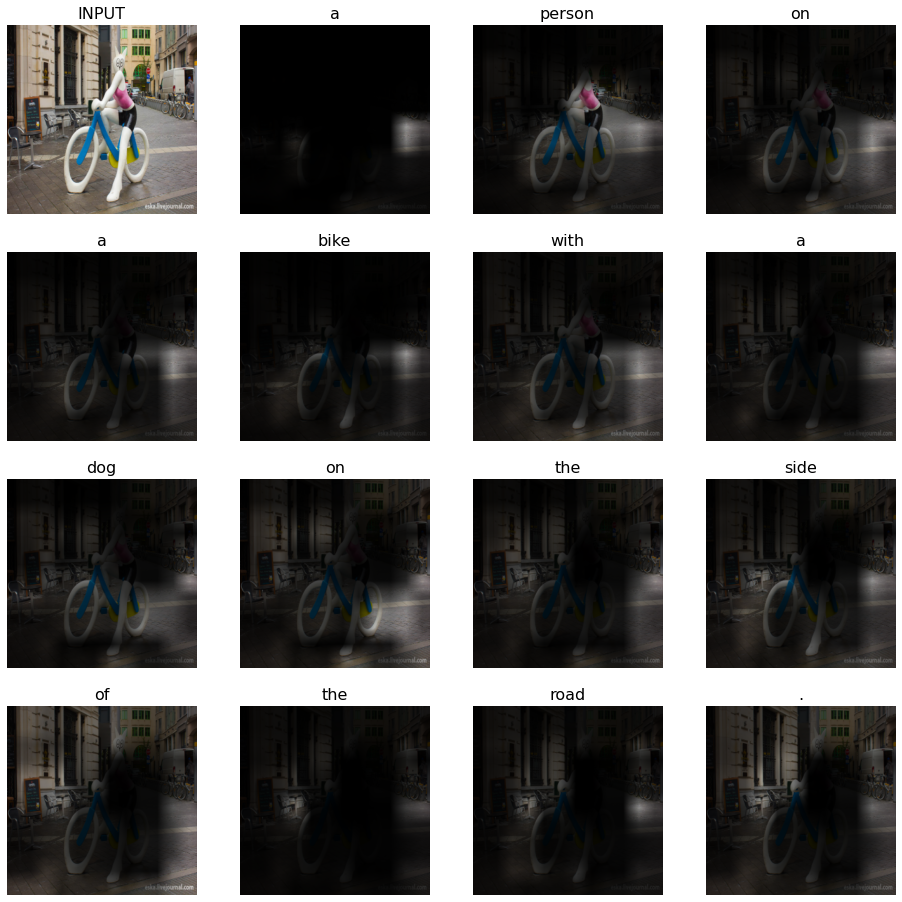

In [52]:
process_image(obtain_image(url="https://ic.pics.livejournal.com/eska/683464/744818/744818_original.jpg"))

a group of people standing on a beach with a mountain .
a train on a track with a lot of people in the background
a train with a lot of people standing around it .
a train on a track with a lot of people .
a train on a track with a lot of people .
a train is on a beach with a mountain .
a train on a track with a mountain in the background .
a train is traveling down a train track
a group of people standing on a beach with a mountain .
a train is going down the tracks in the sky .


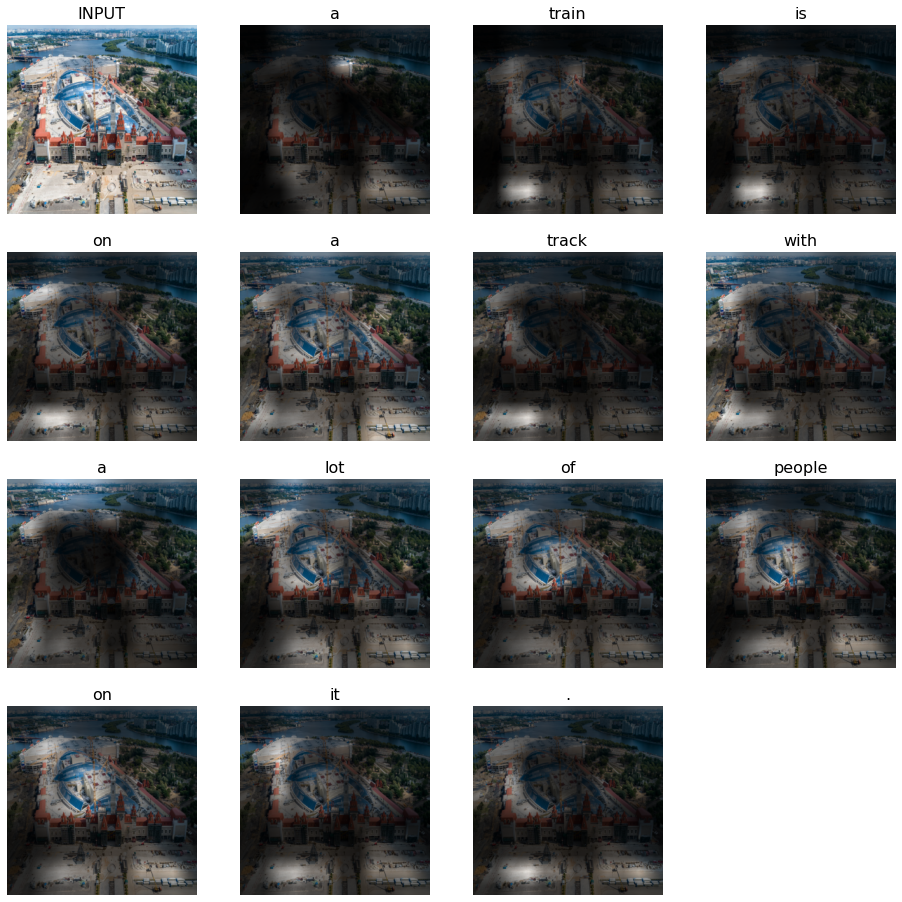

In [53]:
process_image(obtain_image(url="https://cdnimg.rg.ru/img/content/177/10/05/TASS_33592515_d_850.jpg"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

Анализируя протестированные изображения можно сделать вывод, что модель работает хорошо с фото, на которых есть человек на переднем плане, а также задний фон хорошо узнаваем, по фото человеку легко сформулировать предложение с объектом, действием и простым описанием места действия. Модель генерирует плохие описания для фото зданий, городов, на которых нет действующего лица на переднем плане.

### Now what?

Your model produces some captions but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers". The options are listed easiest to hardest.

##### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.

##### Subword level captioning
In the base version, we replace all rare words with UNKs which throws away a lot of information and reduces quality. A better way to deal with vocabulary size problem would be to use Byte-Pair Encoding

* BPE implementation you can use: [github_repo](https://github.com/rsennrich/subword-nmt). 
* Theory: https://arxiv.org/abs/1508.07909
* It was originally built for machine translation, but it should work with captioning just as well.

#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563